Import libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imutils

Read image data

In [2]:
img1 = cv2.imread(r'1.jpg')
img2 = cv2.imread(r'2.jpg')
img3 = cv2.imread(r'3.jpg')

Display Image

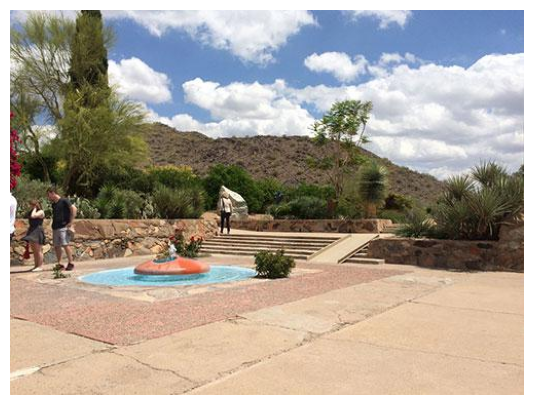

In [3]:
fig = plt.figure(figsize = (10, 5))
plt.axis('off')
plt.imshow(img1[:,:,::-1])

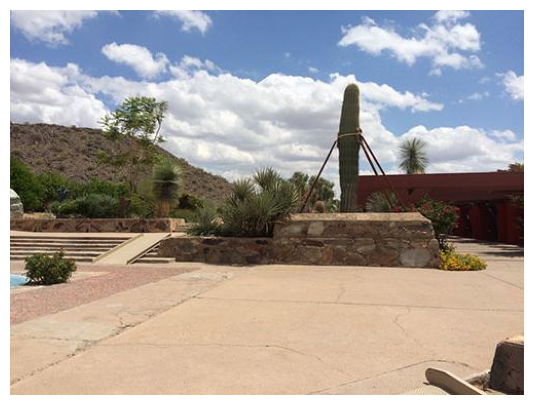

In [4]:
fig = plt.figure(figsize = (10, 5))
plt.axis('off')
plt.imshow(img2[:,:,::-1])

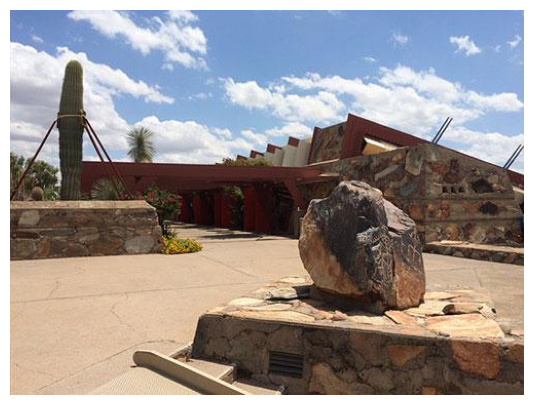

In [5]:
fig = plt.figure(figsize = (10, 5))
plt.axis('off')
plt.imshow(img3[:,:,::-1])

Finding match points

In [6]:
c1 = img1.copy()
c2 = img2.copy()
c3 = img3.copy()

In [7]:
sift = cv2.SIFT_create()
kp1 , des1 = sift.detectAndCompute(c1,None)
kp2 , des2 = sift.detectAndCompute(c2,None)
kp3 , des3 = sift.detectAndCompute(c3,None)

In [8]:
bf = cv2.BFMatcher(cv2.NORM_L2,crossCheck=True)
matches1 = bf.match(des1,des2)
matches2 = bf.match(des2,des3)

In [9]:
matches1 = sorted(matches1,key=lambda x:x.distance)
matches2 = sorted(matches2,key=lambda x:x.distance)

In [10]:
res1 = cv2.drawMatches(c1,kp1,img2,kp2,matches1[:10],c2,flags=2)
res2 = cv2.drawMatches(c2,kp2,img3,kp3,matches2[:10],c3,flags=2)

Match Points in pic 1 and 2 (10 points)

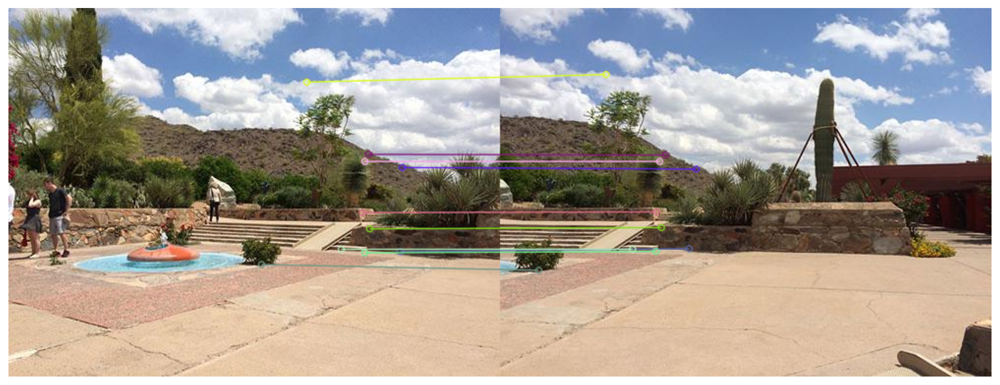

In [11]:
plt.figure(figsize=(15,20), dpi = 200)
plt.axis('off')
plt.imshow(res1[:,:,::-1])

Match Points in pic 2 and 3 (10 points)

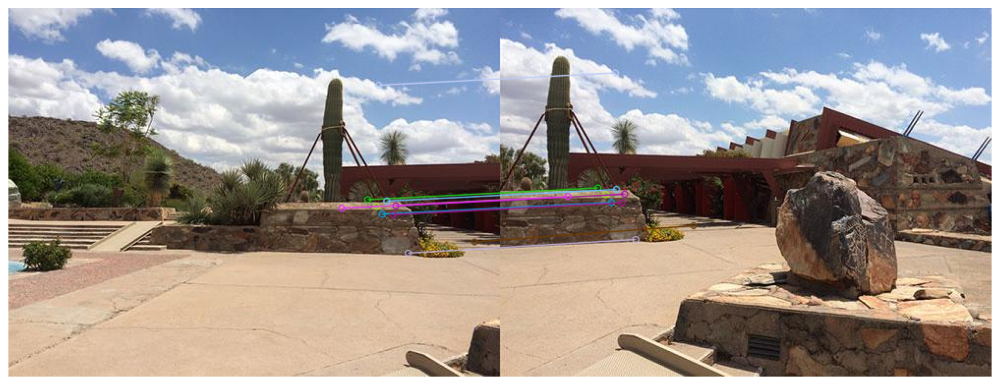

In [12]:
plt.figure(figsize=(15,20), dpi = 200)
plt.axis('off')
plt.imshow(res2[:,:,::-1])

# Create a panorama

In [13]:
imgs = list()
imgs.append(img1)
imgs.append(img2)
imgs.append(img3)

In [14]:
M = cv2.Stitcher.create(cv2.Stitcher_PANORAMA)
status,pano = M.stitch(imgs)

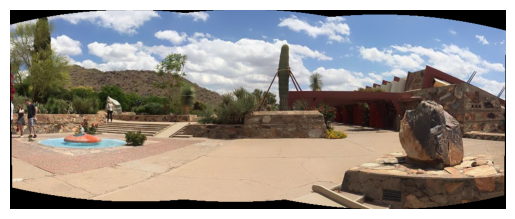

In [15]:
if status == 0:
    plt.axis('off')
    plt.imshow(pano[:,:,::-1])
else:
    print('Error!!!')

# Cropping image

create a 10 pixel border surrounding the stitched image

In [16]:
pano = cv2.copyMakeBorder(pano, 10, 10, 10, 10, cv2.BORDER_CONSTANT, (0, 0, 0))

Convert the stitched image to grayscale and threshold it,<br>
Such that all pixels greater than zero are set to 255 (foreground) while all others remain 0 (background)

In [17]:
gray = cv2.cvtColor(pano, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

Find all external contours in the threshold image then find the largest contour which will be the contour/outline of the stitched image

In [18]:
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

Create two copies of the mask: one to serve as our actual minimum rectangular region and another to serve as a counter <br>
for how many pixels need to be removed to form the minimum rectangular region

In [19]:
mask = np.zeros(thresh.shape, dtype="uint8")
(x, y, w, h) = cv2.boundingRect(c)
cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)
minRect = mask.copy()
sub = mask.copy()

Looping until there are no non-zero pixels left in the subtracted image

In [20]:
while cv2.countNonZero(sub) > 0:
	minRect = cv2.erode(minRect, None)
	sub = cv2.subtract(minRect, thresh)

Find contours in the minimum rectangular mask and then extract the bounding box (x, y)-coordinates <br>
use the bounding box coordinates to extract the our final stitched image

In [21]:
cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)
(x, y, w, h) = cv2.boundingRect(c)
pano = pano[y:y + h, x:x + w]

Result

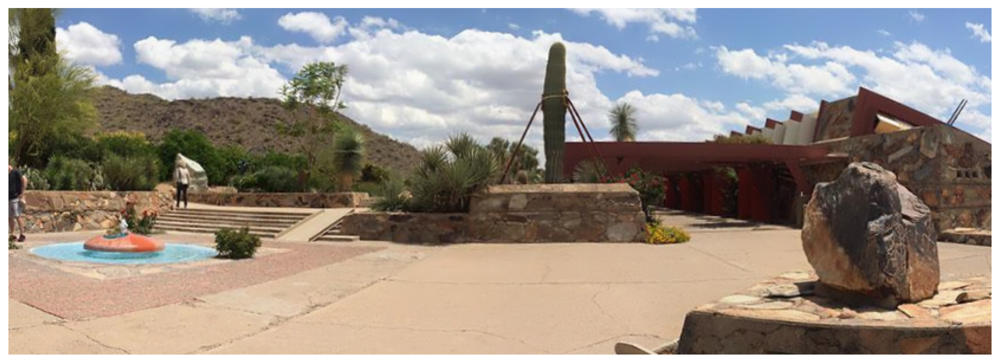

In [22]:
plt.figure(figsize=(15,20), dpi = 200)
plt.axis('off')
plt.imshow(pano[:,:,::-1])